## Exploratory Data Analysis - ESG ratings of companies in the 'Materials' Sector

In [1]:
# This is an example of an exploratory data analysis of ESG ratings, for beginners

# We will focus on companies in the "Materials" sector (categorized per the Global Industry Classification Standard, see https://www.msci.com/our-solutions/indexes/gics)
# We will then narrow down the analysis to explore the "Paper Packaging" Subindustry.

In [2]:
# Helpful resources
# https://python.plainenglish.io/data-storytelling-5-simple-tips-with-python-plotly-to-spice-up-your-data-00865549f2b7
# Thanks to Andrea D'Agostino for his article: https://towardsdatascience.com/exploratory-data-analysis-in-python-a-step-by-step-process-d0dfa6bf94ee  

In [3]:
# Libraries for Exploratory Data Analysis (EDA)

# data manipulation
import pandas as pd
import numpy as np

# data viz
import plotly.express as px
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import rcParams

# apply styling
plt.style.use("ggplot")
rcParams['figure.figsize'] = (12,6)

import requests
import json
from pandas import json_normalize
from pprint import pprint

import os

In [4]:
#pip install pandas
#pip install pyarrow
#pip install plotly.express

In [5]:
# Make sure you're in the correct working directory; this shows the filepath 
os.getcwd()

'C:\\Users\\jenki\\OneDrive\\Desktop\\CTLA-projects\\EDA'

In [6]:
# Use os.chdir() to change the path of the current directory, if necessary
os.chdir('C:\\Users\\jenki\\OneDrive\\Desktop\\CTLA-projects\\GITHUB\\ESG-Scores-Materials-Sector-EDA')
os.getcwd()

'C:\\Users\\jenki\\OneDrive\\Desktop\\CTLA-projects\\GITHUB\\ESG-Scores-Materials-Sector-EDA'

### The data in the csv was extracted from the ESGAnalytics.io API as well as the Finazon.io and Yahoo Finance APIs. You can pull some data without a subscription. 
#### Most of the ESG ratings data was pulled using a subscription. 

#### ESG Analytics.io "[quantifies] ESG information from unstructured text to deliver a third-party perspective on company ESG performance."
#### ESG Analytics.io uses a "proprietary ESG AI engine that leverages Natural Language Processing (NLP) to determine which companies are involved in a given text and extracts 'ESG-relevant' signals using sentiment analysis models, then scores the signals on a scale of -1 (negative) to +1 (positive) for the "ESG_pulse" score.
#### The HIGHER the ESG_pulse score, the BETTER the company is doing regarding ESG issues.

In [7]:
# Step 1: Import dataset using read_csv and save to dataframe
# may not need to add  "encoding="ISO-8859-1"
df = pd.read_csv("MATERIALS-DATASET-Q2_2024.csv", encoding="ISO-8859-1")
df.head()

,Unique_id,Symbol,Company_name,GIC_sector,GIC_industry_group,GIC_Industry,GIC_Subindustry,Address,ESG_pulse,ESG_beta,...,Return on equity,Trailing Price-to-sales,Average volume.1,Market cap.1,Full-time Employees,isin,cusip,Securities_type,Currency_code,url
0,195610,AMVMF,AMG Advanced Metallurgical Group N.V,Materials,Materials_1510,Metals & Mining_151040,Diversified Metals & Mining,"WTC Amsterdam, Amsterdam, Netherlands, 1077 XX",0.331230,0.090095,...,0.05155,0.365035,1161.0,5.597559e+08,3600.0,NaN,NaN,Common Stock,USD,http://www.amg-nv.com
1,195583,ANIOY,"Acerinox, S.A",Materials,Materials_1510,Metals & Mining_151040,Steel,"Calle Santiago de Compostela, 100, Madrid, Spa...",0.180600,NaN,...,0.05192,0.434976,493.0,2.746791e+09,8245.0,NaN,00444E103,Common Stock,USD,http://www.acerinox.com
2,206683,ASIX,AdvanSix Inc,Materials,Materials_1510,Chemicals_151010,Commodity Chemicals,"300 Kimball Drive, Parsippany, NJ, United Stat...",0.608925,NaN,...,0.00309,0.418189,136896.0,6.146892e+08,1450.0,US00773T1016,00773T101,Common Stock,USD,http://www.advansix.com
3,244892,ADES,Advanced Emissions Solutions Inc,Materials,Materials_1510,Chemicals_151010,Specialty Chemicals,"8051 E. Maplewood Avenue, Greenwood Village, C...",0.631753,NaN,...,NaN,NaN,NaN,NaN,NaN,US00770C1018,00770C101,Common Stock,USD,https://www.advancedemissionssolutions.com
4,191126,AEM,Agnico Eagle Mines Limited,Materials,Materials_1510,Metals & Mining_151040,Gold,"145 King Street East, Toronto, ON, Canada, M5C...",0.324521,0.146576,...,0.02392,4.745945,2808933.0,3.297041e+10,NaN,US0084741083,008474108,Common Stock,USD,http://www.agnicoeagle.com


### Understand the big picture of the data

In [8]:
# Use .shape to see the # of rows (the first # below) and the # of columns (the second # below) of the dataset, this dataset has 282 rows and 46 columns
df.shape

(282, 46)

In [9]:
# View info. about the dataframe such as column labels/ names ("Column"), number of values in each column that are not null ("Non-Null Count"),
# and datatype of each column ("Dtype")
# Also shows memory usage 

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 282 entries, 0 to 281
Data columns (total 46 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Unique_id                        282 non-null    int64  
 1   Symbol                           282 non-null    object 
 2   Company_name                     282 non-null    object 
 3   GIC_sector                       282 non-null    object 
 4   GIC_industry_group               280 non-null    object 
 5   GIC_Industry                     280 non-null    object 
 6   GIC_Subindustry                  279 non-null    object 
 7   Address                          282 non-null    object 
 8   ESG_pulse                        282 non-null    float64
 9   ESG_beta                         77 non-null     float64
 10  SNP                              153 non-null    float64
 11  SNP_environmental                146 non-null    float64
 12  SNP_environmental_indu

In [10]:
# The above shows that "Unique_id" is an "int64" datatype and we want to change it to text ("str" or "object") because we don't want the ids to show up in any calculations later on
convert = {"Unique_id": str
          }
df = df.astype(convert)

# Use df.info() to make sure that the datatype conversion worked and is now "object" instead of int64.
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 282 entries, 0 to 281
Data columns (total 46 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Unique_id                        282 non-null    object 
 1   Symbol                           282 non-null    object 
 2   Company_name                     282 non-null    object 
 3   GIC_sector                       282 non-null    object 
 4   GIC_industry_group               280 non-null    object 
 5   GIC_Industry                     280 non-null    object 
 6   GIC_Subindustry                  279 non-null    object 
 7   Address                          282 non-null    object 
 8   ESG_pulse                        282 non-null    float64
 9   ESG_beta                         77 non-null     float64
 10  SNP                              153 non-null    float64
 11  SNP_environmental                146 non-null    float64
 12  SNP_environmental_indu

In [11]:
# Use the .describe function to see descriptive information about the dataset including statistics for numerical variables/ fields
df.describe()

# count is how many values are in the column
# mean is the average of those values
# std is the standard deviation of the values; small number for standard deviation indicates data is clustered more around the mean while a high number means the data are more spread out from the mean
# min is the minimum/ lowest value for the field/ column
# 25% is the 25th percentile which is the value at which 25% of the scores are below 
# 50% aka "median" is the 50th percentile which is the value at which 50% of the scores are below 
# 75% is the 75th percentile which is the value at which 75% of the scores are below 
# max is the highest number for that column 

,ESG_pulse,ESG_beta,SNP,SNP_environmental,SNP_environmental_industry_mean,SNP_social,SNP_social_industry_mean,SNP_governance,SNP_governance_industry_mean,Sustainalytics,...,52-week high,52-week change,Shares outstanding,PEG ratio,Price-to-book,Return on equity,Trailing Price-to-sales,Average volume.1,Market cap.1,Full-time Employees
count,282.000000,77.000000,153.000000,146.000000,220.000000,146.000000,220.000000,146.000000,220.000000,77.000000,...,242.000000,238.000000,2.410000e+02,138.000000,238.000000,239.000000,2.310000e+02,2.360000e+02,2.420000e+02,211.000000
mean,0.222019,0.075356,49.830065,53.226027,35.754545,47.945205,32.627273,48.780822,32.454545,24.271429,...,59.865391,0.008044,6.382544e+08,774.990000,3.954391,-0.217664,2.633165e+01,1.287306e+06,1.085463e+10,14167.118483
std,0.342662,0.168135,15.980165,17.389561,4.789994,17.896554,1.763968,14.258449,2.286096,10.021974,...,91.739210,0.352415,1.406452e+09,9075.391281,16.922709,3.371587,3.322559e+02,3.158036e+06,2.134003e+10,22052.379921
min,-0.907137,-0.390964,13.000000,17.000000,32.000000,7.000000,30.000000,18.000000,29.000000,8.200000,...,0.010000,-0.827931,2.000000e+00,-29.910000,0.000072,-51.624110,1.285121e-10,1.000000e+00,5.200000e+01,3.000000
25%,0.000000,-0.072124,37.000000,39.000000,32.000000,35.250000,32.000000,40.000000,31.000000,16.900000,...,7.000000,-0.190936,4.525250e+07,0.012500,0.505326,-0.009615,2.598587e-01,2.634975e+04,7.053687e+08,1783.000000
50%,0.276570,0.065916,48.000000,52.000000,34.000000,44.000000,32.000000,47.000000,31.000000,24.100000,...,28.495000,0.008784,1.403520e+08,1.190000,1.522443,0.058320,8.190392e-01,3.002270e+05,3.955398e+09,5852.000000
75%,0.431591,0.198499,62.000000,68.000000,38.000000,62.500000,35.000000,59.000000,35.000000,30.400000,...,72.685000,0.197770,5.384780e+08,2.277500,2.629517,0.145100,2.045619e+00,1.106142e+06,1.077192e+10,17137.000000
max,0.956500,0.446866,89.000000,90.000000,47.000000,92.000000,36.000000,87.000000,36.000000,54.000000,...,650.000000,1.269076,1.215460e+10,106614.000000,227.500000,1.295100,5.012454e+03,2.664890e+07,2.116180e+11,145277.000000


In [12]:
# Make sure that the data is properly prepped/ cleaned and ready for analysis
# First, check to see if there are any duplicate rows
# If the output is 0, that's good news because it means that we don't have any duplicates
df.duplicated().sum()

0

In [13]:
# Check whether we need to rename any of the columns to make them more understandable or to fix typos
df.columns

Index(['Unique_id', 'Symbol', 'Company_name', 'GIC_sector',
       'GIC_industry_group', 'GIC_Industry', 'GIC_Subindustry', 'Address',
       'ESG_pulse', 'ESG_beta', 'SNP', 'SNP_environmental',
       'SNP_environmental_industry_mean', 'SNP_social',
       'SNP_social_industry_mean', 'SNP_governance',
       'SNP_governance_industry_mean', 'Sustainalytics', 'MSCI',
       'SNP_normalized', 'Sustainalytics_normalized', 'MSCI_normalized',
       'Company (long) name', 'Exchange', 'Average volume', 'Market cap',
       'Current price', 'Debt-to-equity', 'Trailing P/E', 'Forward P/E',
       '52-week low', '52-week high', '52-week change', 'Shares outstanding',
       'PEG ratio', 'Price-to-book', 'Return on equity',
       'Trailing Price-to-sales', 'Average volume.1', 'Market cap.1',
       'Full-time Employees', 'isin', 'cusip', 'Securities_type',
       'Currency_code', 'url'],
      dtype='object')

In [14]:
# We'll change the names of four columns and save to a new dataframe
# Using inplace = True means that the original dataframe will be modified permanently; 
# Be careful when using inplace=True; for more info., see  https://towardsdatascience.com/a-simple-guide-to-inplace-operations-in-pandas-7a1d97ecce24
df1 = df.rename(columns = {"ESG_pulse": "ESG_AI_score",
                        "SNP_environmental_industry_mean": "SNP_environ_ind_avg",
                        "SNP_social_industry_mean": "SNP_social_ind_avg",
                        "SNP_governance_industry_mean": "SNP_gov_ind_avg"      
                          })
                  
df1.head()

,Unique_id,Symbol,Company_name,GIC_sector,GIC_industry_group,GIC_Industry,GIC_Subindustry,Address,ESG_AI_score,ESG_beta,...,Return on equity,Trailing Price-to-sales,Average volume.1,Market cap.1,Full-time Employees,isin,cusip,Securities_type,Currency_code,url
0,195610,AMVMF,AMG Advanced Metallurgical Group N.V,Materials,Materials_1510,Metals & Mining_151040,Diversified Metals & Mining,"WTC Amsterdam, Amsterdam, Netherlands, 1077 XX",0.331230,0.090095,...,0.05155,0.365035,1161.0,5.597559e+08,3600.0,NaN,NaN,Common Stock,USD,http://www.amg-nv.com
1,195583,ANIOY,"Acerinox, S.A",Materials,Materials_1510,Metals & Mining_151040,Steel,"Calle Santiago de Compostela, 100, Madrid, Spa...",0.180600,NaN,...,0.05192,0.434976,493.0,2.746791e+09,8245.0,NaN,00444E103,Common Stock,USD,http://www.acerinox.com
2,206683,ASIX,AdvanSix Inc,Materials,Materials_1510,Chemicals_151010,Commodity Chemicals,"300 Kimball Drive, Parsippany, NJ, United Stat...",0.608925,NaN,...,0.00309,0.418189,136896.0,6.146892e+08,1450.0,US00773T1016,00773T101,Common Stock,USD,http://www.advansix.com
3,244892,ADES,Advanced Emissions Solutions Inc,Materials,Materials_1510,Chemicals_151010,Specialty Chemicals,"8051 E. Maplewood Avenue, Greenwood Village, C...",0.631753,NaN,...,NaN,NaN,NaN,NaN,NaN,US00770C1018,00770C101,Common Stock,USD,https://www.advancedemissionssolutions.com
4,191126,AEM,Agnico Eagle Mines Limited,Materials,Materials_1510,Metals & Mining_151040,Gold,"145 King Street East, Toronto, ON, Canada, M5C...",0.324521,0.146576,...,0.02392,4.745945,2808933.0,3.297041e+10,NaN,US0084741083,008474108,Common Stock,USD,http://www.agnicoeagle.com


In [15]:
# If you want to save the file at this point, export file as a CSV, without the Pandas index, but with the header
# df1.to_csv("materials_temp.csv", index = False, header=True)

### Univariate analysis/ understand the variables

In [16]:
# Use .value_counts() to see how many companies are in each GIC Subindustry in this dataset, for example;
# You can see below that 47 companies are in the "Specialty Chemicals" subindustry 
# while only one company is in "Health Care Equipment."
df1.GIC_Subindustry.value_counts()

GIC_Subindustry
Specialty Chemicals                     47
Steel                                   40
Commodity Chemicals                     25
Diversified Metals & Mining             23
Construction Materials                  21
Gold                                    21
Fertilizers & Agricultural Chemicals    20
Paper Products                          15
Paper Packaging                         13
Diversified Chemicals                   12
Metal & Glass Containers                11
Aluminum                                 7
Copper                                   6
Forest Products                          6
Silver                                   4
Precious Metals & Minerals               4
Industrial Gases                         3
Health Care Equipment                    1
Name: count, dtype: int64

In [17]:
# Use normalize=True to see percentages
df1.GIC_Subindustry.value_counts(normalize=True)

GIC_Subindustry
Specialty Chemicals                     0.168459
Steel                                   0.143369
Commodity Chemicals                     0.089606
Diversified Metals & Mining             0.082437
Construction Materials                  0.075269
Gold                                    0.075269
Fertilizers & Agricultural Chemicals    0.071685
Paper Products                          0.053763
Paper Packaging                         0.046595
Diversified Chemicals                   0.043011
Metal & Glass Containers                0.039427
Aluminum                                0.025090
Copper                                  0.021505
Forest Products                         0.021505
Silver                                  0.014337
Precious Metals & Minerals              0.014337
Industrial Gases                        0.010753
Health Care Equipment                   0.003584
Name: proportion, dtype: float64

In [18]:
#  Evaluate distribution kurtosis and asymmetry/ skewness, of the S&P Global ESG scores in this case ("SNP")
# Skewed data can affect a machine learning model's predicting capabilities (see https://ashington.medium.com/interpretation-of-measures-of-shape-skewness-kurtosis-b8b87c72c65)

# Kurtosis is a statistical measure that indicates how much data is in the "tails" (furthest from the mean) of normally distributed data 
# In a nutshell, kurtosis is how tall or short the curve is on a graph
# Kurtosis values can range from 1 to infinity, but generally a kurtosis value=3 indicates a normal distribution (see https://www.analyticsvidhya.com/blog/2022/09/importance-of-skewness-kurtosis-co-efficient-of-variation/#:~:text=Range%20of%20Kurtosis,indicates%20negative%20kurtosis%20(Platicurtic).)

# "Skewness is demonstrated on a bell curve when data points are not distributed symmetrically to the left and right sides of the median on a bell curve...
# "Skewness can be quantified as a representation of the extent to which a given distribution varies from a normal distribution." 
# Skewness is used along with kurtosis to better judge the likelihood of data falling in the tails of a probability distribution
# - Investopedia

# If skewness value is -0.5 and 0.5 (as it is below), the distribution (SNP scores, in this case) is almost symmetrical
# If skewness value is -1 to -0.5, the data is negatively skewed (indicates a few extremely low values)
# If skewness value is 0.5 to 1, the data is positively skewed (indicates a few extremely high values)
# If skewness is lower than -1 or greater than 1, the data is highly skewed


print(f"Skewness: {df1['SNP'].skew()}")
print(f"kurtosis: {df1['SNP'].kurt()}")

Skewness: 0.24258752206114031
kurtosis: -0.6953786590476261


In [19]:
# See the skewness and kurtosis of the ESG_AI_score values
print(f"Skewness: {df1['ESG_AI_score'].skew()}")
print(f"kurtosis: {df1['ESG_AI_score'].kurt()}")

Skewness: -0.7709397324814192
kurtosis: 1.1089831362627378


In [20]:
# See the skewness and kurtosis of the Sustainalytics ESG scores values
print(f"Skewness: {df1['Sustainalytics'].skew()}")
print(f"kurtosis: {df1['Sustainalytics'].kurt()}")

Skewness: 0.7718191374980515
kurtosis: 0.6583561036675842


## Visualize the data

In [21]:
# see https://stackoverflow.com/questions/37970424/what-is-the-difference-between-drawing-plots-using-plot-axes-or-figure-in-matpl

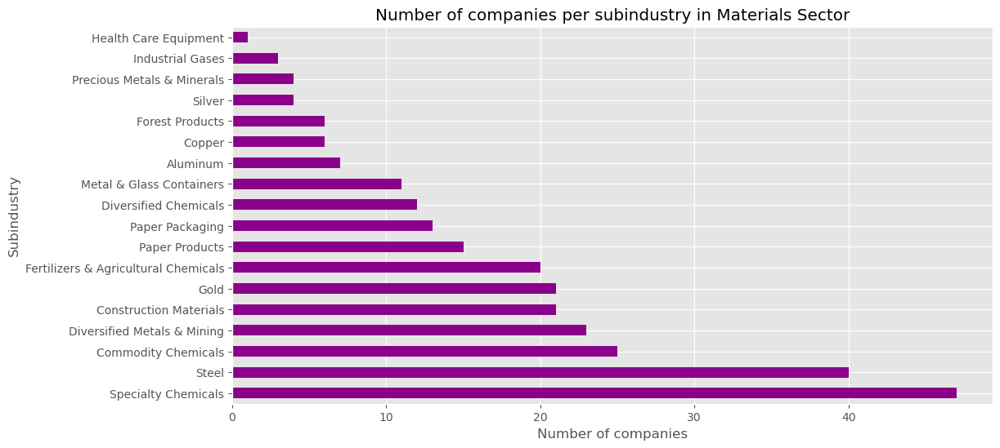

In [22]:
# Simple bar chart using MATPLOTLIB
# We will make tweaks to this in later code

# See https://matplotlib.org/stable/gallery/color/named_colors.html for color options
# kind=barh means horizontal bar chart

# First, we will show how many companies are in each subindustry of the Materials sector
df1.GIC_Subindustry.value_counts().plot(kind="barh", color ='darkmagenta')

plt.title("Number of companies per subindustry in Materials Sector")
plt.xlabel("Number of companies")
plt.ylabel("Subindustry")
plt.show()

In [23]:
# rcParams is a dictionary of styling for matplotlib; if you use it at the beginning of your notebook, it will then apply to all of the plots
# see output below for types of values available (https://drmattcrooks.medium.com/how-to-set-up-rcparams-in-matplotlib-355a0b9494ec#:~:text=What%20is%20rcParams%20in%20matplotlib,apply%20to%20all%20your%20plots.&text=Printing%20out%20rcParams%20in%20a,the%20key%2Dvalue%20pair%20structure.)
rcParams

RcParams({'_internal.classic_mode': False,
          'agg.path.chunksize': 0,
          'animation.bitrate': -1,
          'animation.codec': 'h264',
          'animation.convert_args': ['-layers', 'OptimizePlus'],
          'animation.convert_path': 'convert',
          'animation.embed_limit': 20.0,
          'animation.ffmpeg_args': [],
          'animation.ffmpeg_path': 'ffmpeg',
          'animation.frame_format': 'png',
          'animation.html': 'none',
          'animation.writer': 'ffmpeg',
          'axes.autolimit_mode': 'data',
          'axes.axisbelow': True,
          'axes.edgecolor': 'white',
          'axes.facecolor': '#E5E5E5',
          'axes.formatter.limits': [-5, 6],
          'axes.formatter.min_exponent': 0,
          'axes.formatter.offset_threshold': 4,
          'axes.formatter.use_locale': False,
          'axes.formatter.use_mathtext': False,
          'axes.formatter.useoffset': True,
          'axes.grid': True,
          'axes.grid.axis': 'both',
    

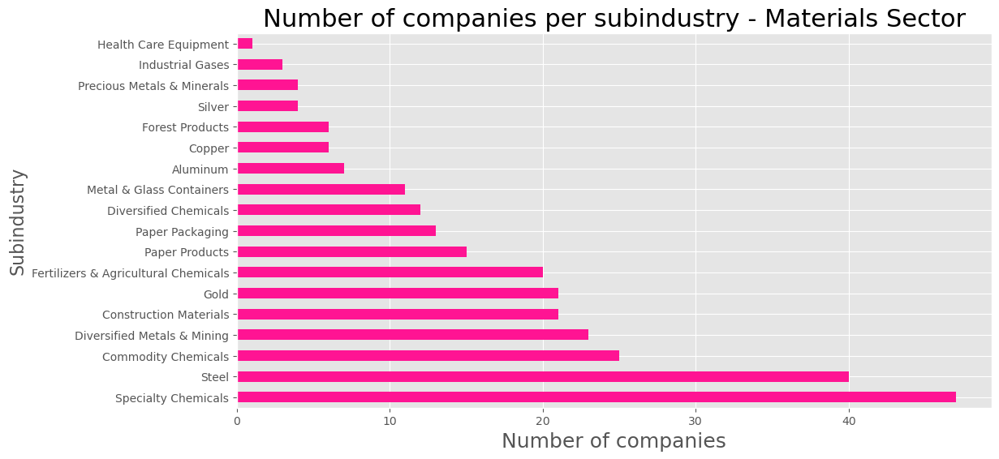

In [24]:
# Add styling to the bar chart
# MATPLOTLIB
df1.GIC_Subindustry.value_counts().plot(kind="barh", color ='deeppink')


# Set the default figure size
plt.rcParams['figure.figsize'] = [10,7]

plt.title("Number of companies per subindustry - Materials Sector", fontsize=22)
plt.xlabel("Number of companies", fontsize=18)
plt.ylabel("Subindustry", fontsize=16)
plt.show()

In [25]:
# See other fonts available for your plot
# https://jonathansoma.com/lede/data-studio/matplotlib/list-all-fonts-available-in-matplotlib-plus-samples/
import matplotlib.font_manager
from IPython.core.display import HTML

def make_html(fontname):
    return "<p>{font}: <span style='font-family:{font}; font-size: 24px;'>{font}</p>".format(font=fontname)

code =  "/n".join([make_html(font) for font in sorted(set([f.name for f in matplotlib.font_manager.fontManager.ttflist]))])

HTML("div style='column-count: 2;'>{}</div".format(code))

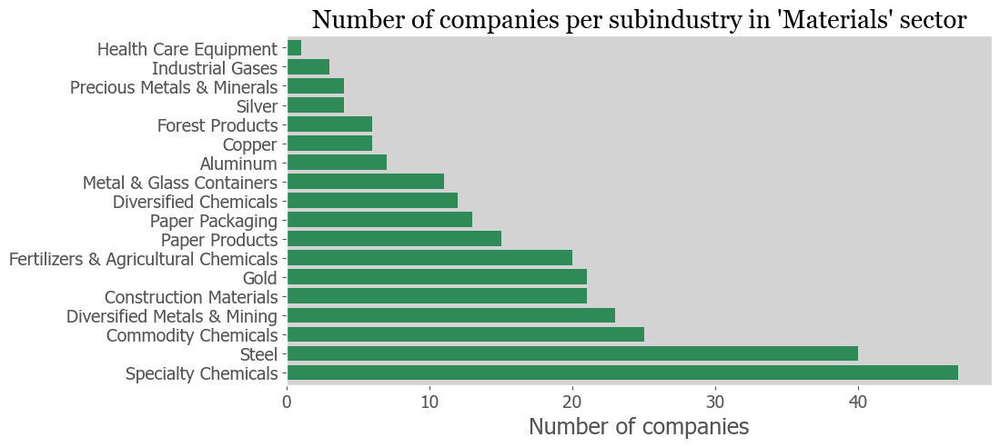

In [26]:
# Remove gridlines, change fonts
# MATPLOTLIB
csfont = {'fontname': 'Georgia'}
hfont = {'fontname': 'Tahoma'}

fig, ax = plt.subplots(figsize=(10,5))

ax = df1.GIC_Subindustry.value_counts().plot(kind="barh", color ='seagreen', width=0.8)

ax.set_facecolor("lightgray")
plt.title("Number of companies per subindustry in 'Materials' sector", fontsize=20,**csfont)
plt.xlabel("Number of companies", fontsize=18,**hfont)
plt.xticks(fontsize=14, **hfont)
plt.ylabel("", fontsize=18)
plt.yticks(fontsize=14, **hfont)
ax.grid(False)

plt.show()

### Histogram example

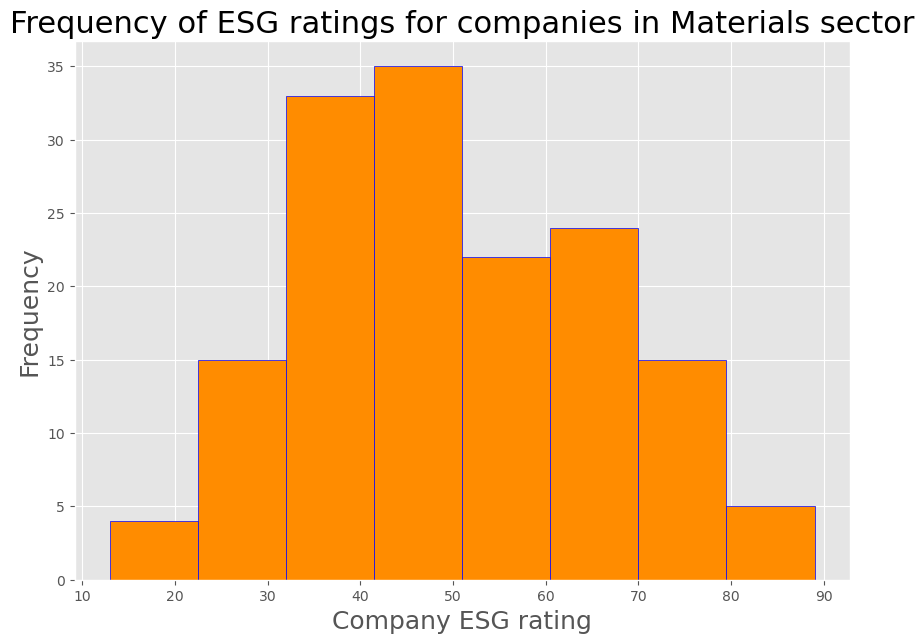

In [27]:
# Plot a histogram of the SNP scores
# Histograms are a graphic representation of numerical data distribution

# Using MATPLOTLIB library

data = df1.SNP  # save the SNP score data from the df1 dataframe in variable called "data"
plt.hist(data, bins = 8, color='darkorange', edgecolor='blue')

#plt.rcParams['figure.figsize'] = [10,10]
#plt.figure(figsize=(5,5))
plt.ylabel('Frequency', fontsize=18)
plt.xlabel("Company ESG rating", fontsize=18)
plt.title("Frequency of ESG ratings for companies in Materials sector", fontsize=22)

# Use plt.savefig to save your plot as an image file
# Note that plt.show() should be placed AFTER plt.savefig() otherwise plt.savefig() will save a blank figure

plt.savefig('histogram-materials-ESG.png',bbox_inches='tight')

plt.show()

# We can see that most companies in the Materials sector have ESG ratings in the range of 40 to 50 (out of 100 max), these are fairly low scores

### Plotly chart

In [28]:
# See https://python-charts.com/ranking/bar-chart-plotly/

In [29]:
df1.columns

Index(['Unique_id', 'Symbol', 'Company_name', 'GIC_sector',
       'GIC_industry_group', 'GIC_Industry', 'GIC_Subindustry', 'Address',
       'ESG_AI_score', 'ESG_beta', 'SNP', 'SNP_environmental',
       'SNP_environ_ind_avg', 'SNP_social', 'SNP_social_ind_avg',
       'SNP_governance', 'SNP_gov_ind_avg', 'Sustainalytics', 'MSCI',
       'SNP_normalized', 'Sustainalytics_normalized', 'MSCI_normalized',
       'Company (long) name', 'Exchange', 'Average volume', 'Market cap',
       'Current price', 'Debt-to-equity', 'Trailing P/E', 'Forward P/E',
       '52-week low', '52-week high', '52-week change', 'Shares outstanding',
       'PEG ratio', 'Price-to-book', 'Return on equity',
       'Trailing Price-to-sales', 'Average volume.1', 'Market cap.1',
       'Full-time Employees', 'isin', 'cusip', 'Securities_type',
       'Currency_code', 'url'],
      dtype='object')

In [30]:
# Let's find out the mean/ average of SNP scores for each Subindustry in the df1 dataframe
# We can use this in a chart later

groupedSNP = df1.groupby(['GIC_Subindustry'])['SNP'].mean()
groupedSNP
# "groupedSNP" is now a Pandas series (series is a structure for a single column of dataframe; can hold data of any type; the first column of a series is the index & second column is the data)

GIC_Subindustry
Aluminum                                51.666667
Commodity Chemicals                     54.230769
Construction Materials                  48.692308
Copper                                  51.500000
Diversified Chemicals                   52.818182
Diversified Metals & Mining             49.777778
Fertilizers & Agricultural Chemicals    46.181818
Forest Products                         41.000000
Gold                                    53.666667
Health Care Equipment                         NaN
Industrial Gases                        66.666667
Metal & Glass Containers                49.555556
Paper Packaging                         52.111111
Paper Products                          50.375000
Precious Metals & Minerals                    NaN
Silver                                  48.000000
Specialty Chemicals                     48.809524
Steel                                   43.500000
Name: SNP, dtype: float64

In [31]:
# Convert the pandas series "groupedSNP" to a dataframe
grouped_SNP_df = groupedSNP.to_frame().reset_index()
grouped_SNP_df

,GIC_Subindustry,SNP
0,Aluminum,51.666667
1,Commodity Chemicals,54.230769
2,Construction Materials,48.692308
3,Copper,51.500000
4,Diversified Chemicals,52.818182
5,Diversified Metals & Mining,49.777778
6,Fertilizers & Agricultural Chemicals,46.181818
7,Forest Products,41.000000
8,Gold,53.666667
9,Health Care Equipment,NaN


In [32]:
# Let's find out the mean/ average of the ESG_AI scores for each Subindustry
groupedAI = df1.groupby(['GIC_Subindustry'])['ESG_AI_score'].mean()
groupedAI

GIC_Subindustry
Aluminum                                0.231005
Commodity Chemicals                     0.350480
Construction Materials                  0.026604
Copper                                  0.235586
Diversified Chemicals                   0.314818
Diversified Metals & Mining             0.083403
Fertilizers & Agricultural Chemicals    0.234828
Forest Products                         0.268978
Gold                                    0.229480
Health Care Equipment                   0.000000
Industrial Gases                        0.425740
Metal & Glass Containers                0.406213
Paper Packaging                         0.259762
Paper Products                          0.224355
Precious Metals & Minerals              0.162863
Silver                                  0.067144
Specialty Chemicals                     0.245480
Steel                                   0.174839
Name: ESG_AI_score, dtype: float64

In [33]:
# Convert the pandas series "groupedAI" to a dataframe
grouped_AI_df2 = groupedAI.to_frame().reset_index()
grouped_AI_df2

,GIC_Subindustry,ESG_AI_score
0,Aluminum,0.231005
1,Commodity Chemicals,0.350480
2,Construction Materials,0.026604
3,Copper,0.235586
4,Diversified Chemicals,0.314818
5,Diversified Metals & Mining,0.083403
6,Fertilizers & Agricultural Chemicals,0.234828
7,Forest Products,0.268978
8,Gold,0.229480
9,Health Care Equipment,0.000000


In [34]:
# Use .sort_values() to sort, by ESG_AI_score in this case
# You can see that 'Industrial Gases' is the subindustry with the best ESG scores
grouped_AI_df = grouped_AI_df2.sort_values('ESG_AI_score', ascending=False)
grouped_AI_df

,GIC_Subindustry,ESG_AI_score
10,Industrial Gases,0.425740
11,Metal & Glass Containers,0.406213
1,Commodity Chemicals,0.350480
4,Diversified Chemicals,0.314818
7,Forest Products,0.268978
12,Paper Packaging,0.259762
16,Specialty Chemicals,0.245480
3,Copper,0.235586
6,Fertilizers & Agricultural Chemicals,0.234828
0,Aluminum,0.231005


In [35]:
grouped_SNP_df.dtypes

GIC_Subindustry     object
SNP                float64
dtype: object

In [36]:
grouped_AI_df.dtypes

GIC_Subindustry     object
ESG_AI_score       float64
dtype: object

In [37]:
type(grouped_SNP_df)

pandas.core.frame.DataFrame

In [38]:
# Plotly plots values in the order they appear in the dataframe so it helps to sort values before plotting if you want them in ascending or descending order
sorted_SNP = grouped_SNP_df.sort_values(by=['SNP'], ascending=False)
sorted_SNP

,GIC_Subindustry,SNP
10,Industrial Gases,66.666667
1,Commodity Chemicals,54.230769
8,Gold,53.666667
4,Diversified Chemicals,52.818182
12,Paper Packaging,52.111111
0,Aluminum,51.666667
3,Copper,51.500000
13,Paper Products,50.375000
5,Diversified Metals & Mining,49.777778
11,Metal & Glass Containers,49.555556


In [39]:
# Round the values to 2 decimal points
sorted_SNP['SNP'] = sorted_SNP['SNP'].apply(lambda x: round(x,2))
sorted_SNP

,GIC_Subindustry,SNP
10,Industrial Gases,66.67
1,Commodity Chemicals,54.23
8,Gold,53.67
4,Diversified Chemicals,52.82
12,Paper Packaging,52.11
0,Aluminum,51.67
3,Copper,51.50
13,Paper Products,50.38
5,Diversified Metals & Mining,49.78
11,Metal & Glass Containers,49.56


In [40]:
# Round the ESG_AI_score values to 4 decimal points
grouped_AI_df['ESG_AI_score'] = grouped_AI_df['ESG_AI_score'].apply(lambda x: round(x,4))
grouped_AI_df

,GIC_Subindustry,ESG_AI_score
10,Industrial Gases,0.4257
11,Metal & Glass Containers,0.4062
1,Commodity Chemicals,0.3505
4,Diversified Chemicals,0.3148
7,Forest Products,0.2690
12,Paper Packaging,0.2598
16,Specialty Chemicals,0.2455
3,Copper,0.2356
6,Fertilizers & Agricultural Chemicals,0.2348
0,Aluminum,0.2310


### More visualizations

In [41]:
# Plot bar chart using Plotly library
# We will show the mean (average) of S&P Global ESG scores ("SNP")for companies in the Materials Sector

fig = px.bar(sorted_SNP,
             x ="GIC_Subindustry", 
             y="SNP", 
             title ="Average ESG scores for subindustries of Materials sector (S&P Global)",
             text_auto= True,
             labels={"GIC_Subindustry": "Subindustries",
                     "SNP": "S&P Global rating"
                    }
             )

# Use fig.update_traces to update a plot with other features; "marker" typically means a point in your chart, it is the bars in this example
# Here, we are adding colors for the bars, making the bar outlines blue, making the width of the outlines of the bars = 2, and changing the opacity (values used can be 0-1))
fig.update_traces(marker_color='orange', marker_line_color='blue',
                 marker_line_width=2, opacity=0.8)
fig.show()

In [42]:
# Note that for Plotly, "Static image generation requires either Kaleido (recommended, supported as of plotly 4.9) or orca (legacy as of plotly 4.9). The kaleido package can be installed using pip..."

#pip install -U kaleido

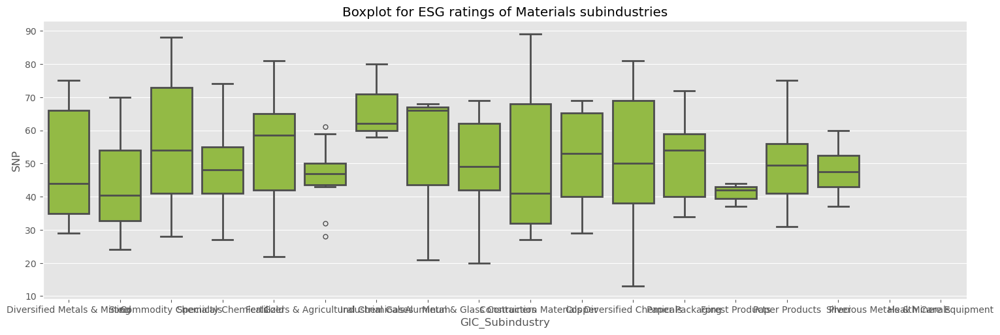

In [43]:
# Check out the relationship between a categorical variable (GIC Subindustry) and a numerical one (SNP) using a boxplot
# Using Seaborn and Matplotlib
# We will fix the x axis labels in the next step - this is to show the chart before adjusting the labels
sns.catplot(x='GIC_Subindustry', y="SNP", data=df1, kind="box", linewidth=2, color='yellowgreen',aspect=3.0)
plt.title("Boxplot for ESG ratings of Materials subindustries")

plt.show()

# The limits of the boxes indicate the range of the CENTRAL 50% OF THE DATA, the central horizontal line marks the median, 
# the lines that extend from each box capture the range of the remaining data
# any dots beyond the line edges show outliers


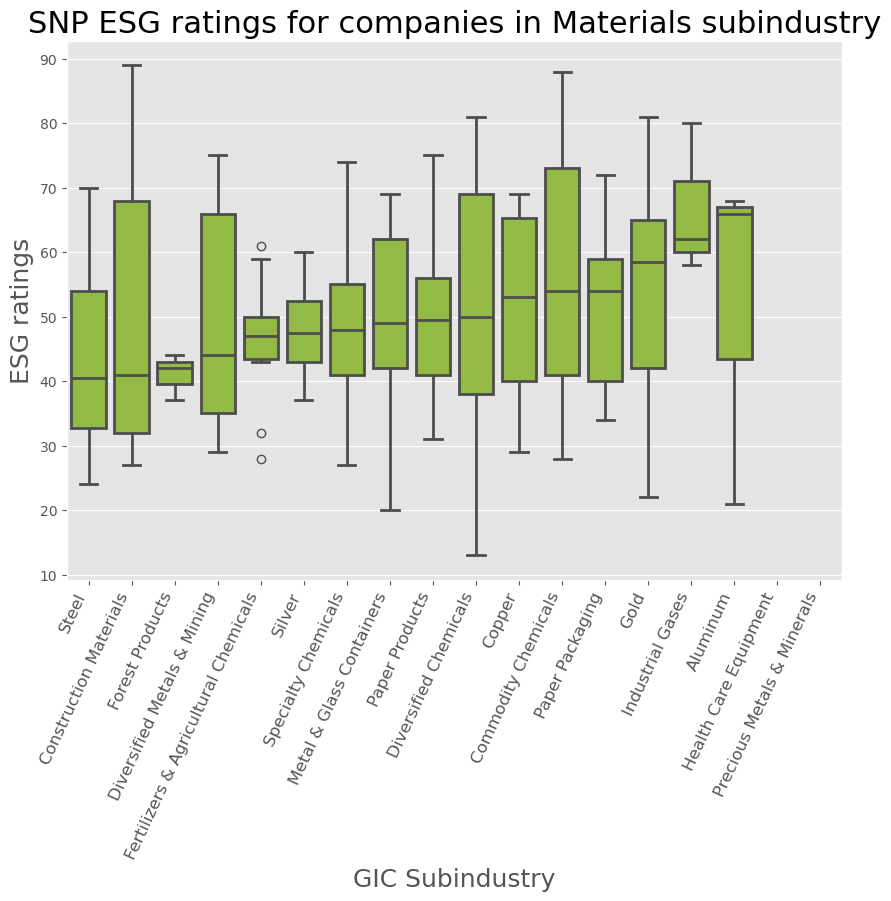

In [44]:
# Rotate the x axis labels and sort the boxplot by median of SNP values

grouped_plot = df1.loc[:,["GIC_Subindustry", "SNP"]]\
    .groupby(["GIC_Subindustry"])\
    .median()\
    .sort_values(by="SNP")
sns.boxplot(x=df1.GIC_Subindustry, y=df1.SNP, order=grouped_plot.index, linewidth=2, color='yellowgreen')

plt.xticks(rotation=65, fontsize='large', ha='right')  # "ha" means horizontal alignment, if you don't use this, the labels won't be centered well
plt.ylabel('ESG ratings', fontsize=18)
plt.xlabel("GIC Subindustry", fontsize=18)
plt.title("SNP ESG ratings for companies in Materials subindustry", fontsize=22)
#    fontweight='light'

plt.show()

### Explore "Paper Packaging" Subindustry

In [46]:
df1["GIC_Subindustry"].value_counts()

GIC_Subindustry
Specialty Chemicals                     47
Steel                                   40
Commodity Chemicals                     25
Diversified Metals & Mining             23
Construction Materials                  21
Gold                                    21
Fertilizers & Agricultural Chemicals    20
Paper Products                          15
Paper Packaging                         13
Diversified Chemicals                   12
Metal & Glass Containers                11
Aluminum                                 7
Copper                                   6
Forest Products                          6
Silver                                   4
Precious Metals & Minerals               4
Industrial Gases                         3
Health Care Equipment                    1
Name: count, dtype: int64

In [47]:
# Select only companies that are in the Paper Packaging GIC Subindustry
df_paper_packaging = df1[(df1)['GIC_Subindustry']== 'Paper Packaging']
df_paper_packaging.head(5)

,Unique_id,Symbol,Company_name,GIC_sector,GIC_industry_group,GIC_Industry,GIC_Subindustry,Address,ESG_AI_score,ESG_beta,...,Return on equity,Trailing Price-to-sales,Average volume.1,Market cap.1,Full-time Employees,isin,cusip,Securities_type,Currency_code,url
27,189839,AVY,Avery Dennison Corporation,Materials,Materials_1510,Containers & Packaging_151030,Paper Packaging,"207 Goode Avenue, Glendale, CA, United States,...",0.319381,NaN,...,0.26099,2.086328,435696.0,1.763072e+10,35000.0,US0536111091,053611109,Common Stock,USD,http://www.averydennison.com
36,191478,BLRDF,BillerudKorsnas AB (publ),Materials,Materials_1510,Containers & Packaging_151030,Paper Packaging,"PO Box 703, Solna, Sweden, 169 27",0.000000,NaN,...,0.00558,0.056910,1.0,2.292570e+09,5833.0,NaN,NaN,Common Stock,USD,http://www.billerudkorsnas.com
76,196389,DITHF,DS Smith Plc,Materials,Materials_1510,Containers & Packaging_151030,Paper Packaging,"Regent's Place, London, United Kingdom, NW1 3AX",0.258508,NaN,...,0.09582,1.087788,688.0,7.420889e+09,NaN,NaN,NaN,Common Stock,USD,http://www.dssmith.com
109,191321,GPK,Graphic Packaging Holding Company,Materials,Materials_1510,Containers & Packaging_151030,Paper Packaging,"1500 Riveredge Parkway, Atlanta, GA, United St...",0.319566,NaN,...,0.26354,0.870317,2500224.0,8.049567e+09,23500.0,US3886891015,388688103,Common Stock,USD,http://www.graphicpkg.com
110,192379,GRVWF,Greatview Aseptic Packaging Company Limited,Materials,Materials_1510,Containers & Packaging_151030,Paper Packaging,"A4-2F No.14 Jiuxianqiao Road, Beijing, China, ...",0.136700,NaN,...,0.08846,0.109682,28890.0,4.186212e+08,1791.0,NaN,NaN,Common Stock,USD,http://www.greatviewpack.com


In [48]:
# View statistics for the paper packaging subindustry 
df_paper_packaging.describe()

,ESG_AI_score,ESG_beta,SNP,SNP_environmental,SNP_environ_ind_avg,SNP_social,SNP_social_ind_avg,SNP_governance,SNP_gov_ind_avg,Sustainalytics,...,52-week high,52-week change,Shares outstanding,PEG ratio,Price-to-book,Return on equity,Trailing Price-to-sales,Average volume.1,Market cap.1,Full-time Employees
count,13.000000,3.000000,9.000000,9.000000,13.0,9.000000,13.0,9.000000,13.0,5.000000,...,13.000000,13.000000,1.300000e+01,8.000000,13.000000,13.000000,13.000000,1.300000e+01,1.300000e+01,12.000000
mean,0.259762,0.070938,52.111111,57.111111,44.0,48.111111,35.0,51.000000,35.0,18.960000,...,77.610000,0.228587,3.579989e+08,0.182500,3.158760,0.162444,1.226406,1.205010e+06,7.589580e+09,20923.750000
std,0.097762,0.110562,13.439163,15.838596,0.0,14.861397,0.0,11.390786,0.0,3.888187,...,91.356569,0.237831,4.698653e+08,4.200373,2.877624,0.204618,1.309965,1.976783e+06,5.975920e+09,15891.375232
min,0.000000,-0.037027,34.000000,35.000000,44.0,29.000000,35.0,38.000000,35.0,14.100000,...,0.325000,-0.150845,7.670490e+06,-7.300000,0.075938,-0.057290,0.056910,1.000000e+00,4.186212e+08,1791.000000
25%,0.257688,0.014444,40.000000,49.000000,44.0,37.000000,35.0,39.000000,35.0,17.900000,...,15.840000,0.103811,9.825740e+07,-1.312500,1.503599,0.031130,0.672497,2.889000e+04,2.292570e+09,12633.250000
50%,0.263968,0.065915,54.000000,53.000000,44.0,45.000000,35.0,50.000000,35.0,18.100000,...,47.120000,0.260376,1.791490e+08,-0.070000,2.068360,0.107710,0.870317,4.356960e+05,5.112543e+09,17434.000000
75%,0.319362,0.124920,59.000000,68.000000,44.0,60.000000,35.0,60.000000,35.0,19.900000,...,61.730000,0.347175,3.072940e+08,1.600000,4.040826,0.185400,1.087788,1.549464e+06,1.308411e+10,26375.000000
max,0.392115,0.183925,72.000000,80.000000,44.0,73.000000,35.0,66.000000,35.0,24.800000,...,271.925000,0.714773,1.407130e+09,7.470000,8.544658,0.761640,5.069369,7.063411e+06,1.763072e+10,56100.000000


In [49]:
# use sort_values() to sort the "SNP" column, create a new dataframe called df_paper_packaging2
df_paper_packaging2 = df_paper_packaging.sort_values('SNP', ascending =False)
# reset the index of the dataframe and use drop=True to remove the "old" index
df_paper_packaging2.reset_index(drop=True)

,Unique_id,Symbol,Company_name,GIC_sector,GIC_industry_group,GIC_Industry,GIC_Subindustry,Address,ESG_AI_score,ESG_beta,...,Return on equity,Trailing Price-to-sales,Average volume.1,Market cap.1,Full-time Employees,isin,cusip,Securities_type,Currency_code,url
0,196389,DITHF,DS Smith Plc,Materials,Materials_1510,Containers & Packaging_151030,Paper Packaging,"Regent's Place, London, United Kingdom, NW1 3AX",0.258508,NaN,...,0.09582,1.087788,688.0,7.420889e+09,NaN,NaN,NaN,Common Stock,USD,http://www.dssmith.com
1,196000,HOYFF,Huhtamaki Oyj,Materials,Materials_1510,Containers & Packaging_151030,Paper Packaging,"Revontulenkuja 1, Espoo, Finland, 02100",0.392115,NaN,...,0.10771,1.018553,32.0,4.202244e+09,17868.0,NaN,NaN,Common Stock,USD,http://www.huhtamaki.com
2,190000,WRK,WestRock Company,Materials,Materials_1510,Containers & Packaging_151030,Paper Packaging,"1000 Abernathy Road NE, Atlanta, GA, United St...",0.292063,-0.037027,...,0.03113,0.672497,2486133.0,1.308411e+10,56100.0,US96145D1054,96145D105,Common Stock,USD,http://www.westrock.com
3,191321,GPK,Graphic Packaging Holding Company,Materials,Materials_1510,Containers & Packaging_151030,Paper Packaging,"1500 Riveredge Parkway, Atlanta, GA, United St...",0.319566,NaN,...,0.26354,0.870317,2500224.0,8.049567e+09,23500.0,US3886891015,388688103,Common Stock,USD,http://www.graphicpkg.com
4,191219,SON,Sonoco Products Company,Materials,Materials_1510,Containers & Packaging_151030,Paper Packaging,"1 North Second Street, Hartsville, SC, United ...",0.257688,NaN,...,0.16961,0.748418,643870.0,5.006205e+09,22000.0,US8354951027,835495102,Common Stock,USD,http://www.sonoco.com
5,189839,AVY,Avery Dennison Corporation,Materials,Materials_1510,Containers & Packaging_151030,Paper Packaging,"207 Goode Avenue, Glendale, CA, United States,...",0.319381,NaN,...,0.26099,2.086328,435696.0,1.763072e+10,35000.0,US0536111091,053611109,Common Stock,USD,http://www.averydennison.com
6,191096,SEE,Sealed Air Corporation,Materials,Materials_1510,Containers & Packaging_151030,Paper Packaging,"2415 Cascade Pointe Boulevard, Charlotte, NC, ...",0.260073,0.065915,...,0.76164,0.934703,1549464.0,5.112543e+09,17000.0,US81211K1007,81211K100,Common Stock,USD,http://www.sealedair.com
7,190125,PKG,Packaging Corporation of America,Materials,Materials_1510,Containers & Packaging_151030,Paper Packaging,"1 North Field Court, Lake Forest, IL, United S...",0.310988,NaN,...,0.18540,2.101952,569680.0,1.640699e+10,14900.0,US6951561090,695156109,Common Stock,USD,http://www.packagingcorp.com
8,190398,IP,International Paper Company,Materials,Materials_1510,Containers & Packaging_151030,Paper Packaging,"6400 Poplar Avenue, Memphis, TN, United States...",0.246490,0.183925,...,0.02235,0.807690,7063411.0,1.495438e+10,39000.0,US4601461035,460146103,Common Stock,USD,http://www.internationalpaper.com
9,191478,BLRDF,BillerudKorsnas AB (publ),Materials,Materials_1510,Containers & Packaging_151030,Paper Packaging,"PO Box 703, Solna, Sweden, 169 27",0.000000,NaN,...,0.00558,0.056910,1.0,2.292570e+09,5833.0,NaN,NaN,Common Stock,USD,http://www.billerudkorsnas.com


In [50]:
#Plot a simple bar chart using Plotly library ("px")

# See https://www.storytellingwithdata.com/blog/2020/2/19/what-is-a-bar-chart
# Bar charts are helpful when you want to compare across categories (ESG scores of copmanies in the Paper Packaging Subindustry, in this example)
# This chart can answer questions such as: Which paper packaging company has the best ESG score and which has the worst?

# See helpful Plotly cheatsheet from datacamp: https://www.datacamp.com/cheat-sheet/plotly-express-cheat-sheet

fig = px.bar(df_paper_packaging2,
             x ="Company_name", 
             y="SNP", 
             title ="ESG scores of companies in the Paper Packaging subindustry (Materials sector)",
             #text_auto= True,
             labels={"Company_name": "Company",
                     "SNP": "S&P Global ESG score"
                    }
             )
# The code below updates the bar chart we called "fig" using fig.update_traces()
fig.update_traces(marker_color='orange', marker_line_color='blue',
                 marker_line_width=1, opacity=0.7)
fig.show()

In [51]:
# Make a copy of our dataframe, with a shorter name 
dff = df_paper_packaging2.copy()
dff.head(5)

,Unique_id,Symbol,Company_name,GIC_sector,GIC_industry_group,GIC_Industry,GIC_Subindustry,Address,ESG_AI_score,ESG_beta,...,Return on equity,Trailing Price-to-sales,Average volume.1,Market cap.1,Full-time Employees,isin,cusip,Securities_type,Currency_code,url
76,196389,DITHF,DS Smith Plc,Materials,Materials_1510,Containers & Packaging_151030,Paper Packaging,"Regent's Place, London, United Kingdom, NW1 3AX",0.258508,NaN,...,0.09582,1.087788,688.0,7.420889e+09,NaN,NaN,NaN,Common Stock,USD,http://www.dssmith.com
120,196000,HOYFF,Huhtamaki Oyj,Materials,Materials_1510,Containers & Packaging_151030,Paper Packaging,"Revontulenkuja 1, Espoo, Finland, 02100",0.392115,NaN,...,0.10771,1.018553,32.0,4.202244e+09,17868.0,NaN,NaN,Common Stock,USD,http://www.huhtamaki.com
272,190000,WRK,WestRock Company,Materials,Materials_1510,Containers & Packaging_151030,Paper Packaging,"1000 Abernathy Road NE, Atlanta, GA, United St...",0.292063,-0.037027,...,0.03113,0.672497,2486133.0,1.308411e+10,56100.0,US96145D1054,96145D105,Common Stock,USD,http://www.westrock.com
109,191321,GPK,Graphic Packaging Holding Company,Materials,Materials_1510,Containers & Packaging_151030,Paper Packaging,"1500 Riveredge Parkway, Atlanta, GA, United St...",0.319566,NaN,...,0.26354,0.870317,2500224.0,8.049567e+09,23500.0,US3886891015,388688103,Common Stock,USD,http://www.graphicpkg.com
224,191219,SON,Sonoco Products Company,Materials,Materials_1510,Containers & Packaging_151030,Paper Packaging,"1 North Second Street, Hartsville, SC, United ...",0.257688,NaN,...,0.16961,0.748418,643870.0,5.006205e+09,22000.0,US8354951027,835495102,Common Stock,USD,http://www.sonoco.com


In [52]:
# Double check the data types to make sure that columns that should be text are "object" and columns that should be numerical are "float64"
dff.dtypes

Unique_id                     object
Symbol                        object
Company_name                  object
GIC_sector                    object
GIC_industry_group            object
GIC_Industry                  object
GIC_Subindustry               object
Address                       object
ESG_AI_score                 float64
ESG_beta                     float64
SNP                          float64
SNP_environmental            float64
SNP_environ_ind_avg          float64
SNP_social                   float64
SNP_social_ind_avg           float64
SNP_governance               float64
SNP_gov_ind_avg              float64
Sustainalytics               float64
MSCI                          object
SNP_normalized               float64
Sustainalytics_normalized    float64
MSCI_normalized              float64
Company (long) name           object
Exchange                      object
Average volume               float64
Market cap                   float64
Current price                float64
D

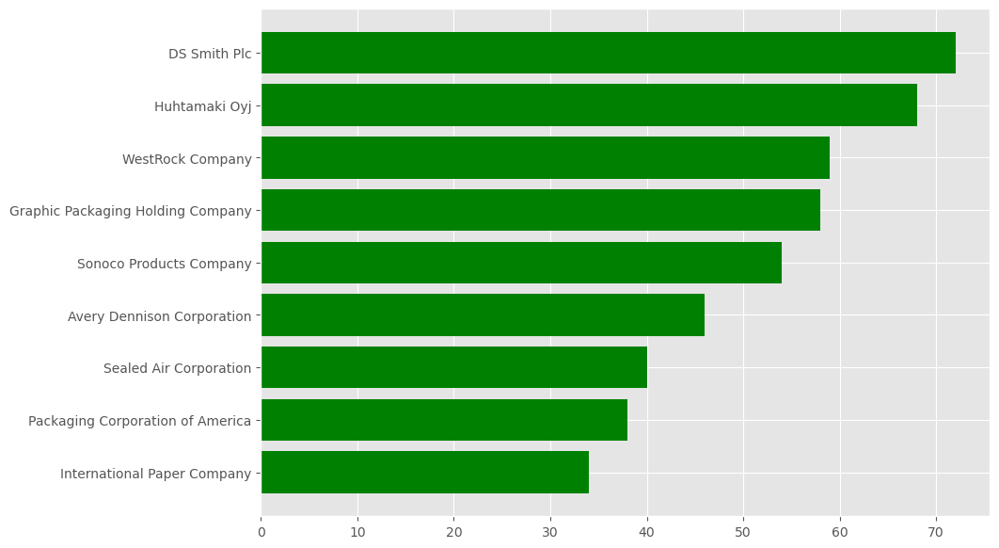

In [53]:
# Create horizontal bar chart using Matplotlib 
# See https://towardsdatascience.com/7-steps-to-help-you-make-your-matplotlib-bar-charts-beautiful-f87419cb14cb

dff2 = dff.sort_values('SNP').reset_index(drop=True)

# By using plot.subplot() funtion, we could create multiple charts/ plots within a single "figure" 
# allows control over how the individual plots are created
# See https://matplotlib.org/3.1.0/gallery/subplots_axes_and_figures/subplots_demo.html
#fig, ax = plt.subplot(figsize=(10,7))

plt.barh(dff2['Company_name'],dff2['SNP'], color='green')

# For description of formatting spines (the lines confining a chart's area): https://towardsdatascience.com/handling-plot-axis-spines-in-python-f143b8554da2
ax.spines[['right', 'top', 'bottom']].set_visible(False)
ax.xaxis.set_visible(False)

# see https://towardsdatascience.com/what-are-the-plt-and-ax-in-matplotlib-exactly-d2cf4bf164a9
plt.show()

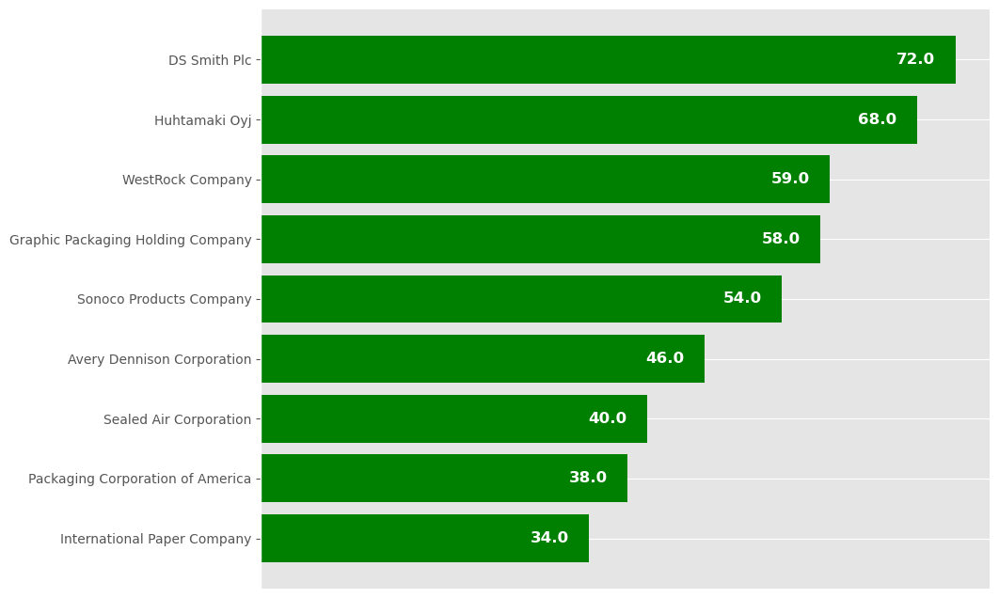

In [54]:
# Add formatting
dff2 = dff.sort_values('SNP').reset_index(drop=True)

fig, ax = plt.subplots(figsize=(10,8))

bars = plt.barh(dff2['Company_name'],dff2['SNP'], color='green')

ax.spines[['right', 'top', 'bottom']].set_visible(False)
ax.xaxis.set_visible(False)

# Create labels using the bar_label function, this setting of "padding" places the labels just inside of ends of the bars
# fmt='%.3f' formats the numbers to 3 decimal places
ax.bar_label(bars, padding=-45, color='white',
            fontsize=12, label_type='edge', fmt='%.1f', fontweight='bold')

plt.show()

In [74]:
dff2 = dff.sort_values('SNP').reset_index(drop=True)
dff2.head(5)

,Unique_id,Symbol,Company_name,GIC_sector,GIC_industry_group,GIC_Industry,GIC_Subindustry,Address,ESG_AI_score,ESG_beta,...,Return on equity,Trailing Price-to-sales,Average volume.1,Market cap.1,Full-time Employees,isin,cusip,Securities_type,Currency_code,url
0,190398,IP,International Paper Company,Materials,Materials_1510,Containers & Packaging_151030,Paper Packaging,"6400 Poplar Avenue, Memphis, TN, United States...",0.246490,0.183925,...,0.02235,0.807690,7063411.0,1.495438e+10,39000.0,US4601461035,460146103,Common Stock,USD,http://www.internationalpaper.com
1,190125,PKG,Packaging Corporation of America,Materials,Materials_1510,Containers & Packaging_151030,Paper Packaging,"1 North Field Court, Lake Forest, IL, United S...",0.310988,NaN,...,0.18540,2.101952,569680.0,1.640699e+10,14900.0,US6951561090,695156109,Common Stock,USD,http://www.packagingcorp.com
2,191096,SEE,Sealed Air Corporation,Materials,Materials_1510,Containers & Packaging_151030,Paper Packaging,"2415 Cascade Pointe Boulevard, Charlotte, NC, ...",0.260073,0.065915,...,0.76164,0.934703,1549464.0,5.112543e+09,17000.0,US81211K1007,81211K100,Common Stock,USD,http://www.sealedair.com
3,189839,AVY,Avery Dennison Corporation,Materials,Materials_1510,Containers & Packaging_151030,Paper Packaging,"207 Goode Avenue, Glendale, CA, United States,...",0.319381,NaN,...,0.26099,2.086328,435696.0,1.763072e+10,35000.0,US0536111091,053611109,Common Stock,USD,http://www.averydennison.com
4,191219,SON,Sonoco Products Company,Materials,Materials_1510,Containers & Packaging_151030,Paper Packaging,"1 North Second Street, Hartsville, SC, United ...",0.257688,NaN,...,0.16961,0.748418,643870.0,5.006205e+09,22000.0,US8354951027,835495102,Common Stock,USD,http://www.sonoco.com


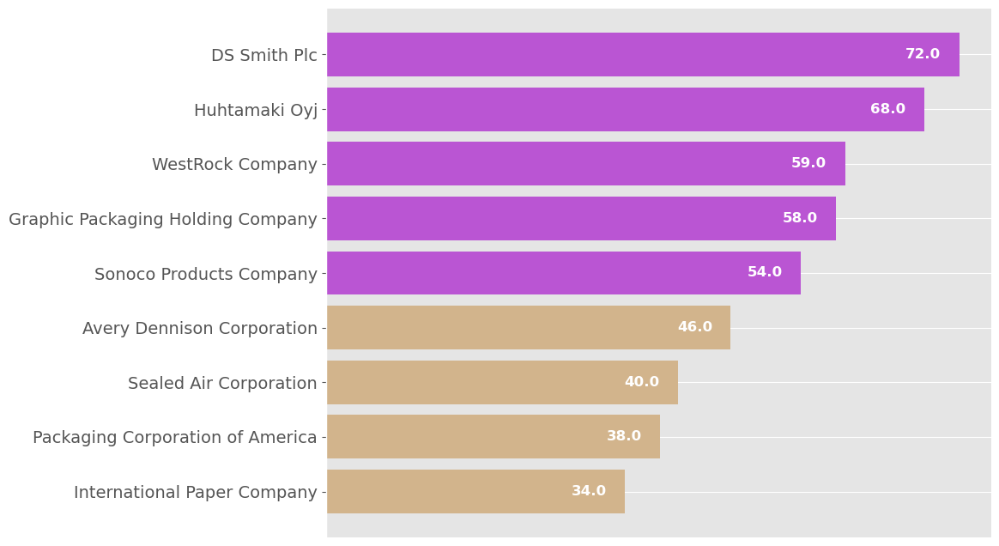

In [56]:
# We will now add coloring to the labels to discern those above and below a certain threshold (the median of the SNP scores in this case, which is 54.0)
# Matplotlib

medianscore = 54.0  # see the 50% value in the cell where we viewed df_paper_packaging.describe()
highlight_color = '#BA55D3'  # mediumorchid, HEX code is BA55D3
nonhighlight = '#D2B48C'  # tan, HEX code is D2B48C

# lambda function is essentially a one-line function without a name that is used ad-hoc and won't be needed again, hence it doesn't need a name; see https://www.reddit.com/r/learnpython/comments/ool7m8/what_in_the_hell_is_lambda/
# We want the color for companies with values equal or above "medianscore" to have "highlight_color" 
# else we want companies that are less than "medianscore" to have "nonhighlight" color
dff2['colors'] = dff2['SNP'].apply(lambda x: highlight_color if x >= medianscore else nonhighlight)

# Using subplots even though there will be only one plot on our figure for now
fig, ax = plt.subplots(figsize=(10,8))

bars = plt.barh(dff2['Company_name'],dff2['SNP'], color=dff2['colors'])

ax.spines[['right', 'top', 'bottom']].set_visible(False)
ax.xaxis.set_visible(False)
ax.yaxis.set_tick_params(labelsize=14)
ax.bar_label(bars, padding=-45, color='white',
            fontsize=12, label_type='edge', fmt='%.1f', fontweight='bold')

plt.show()

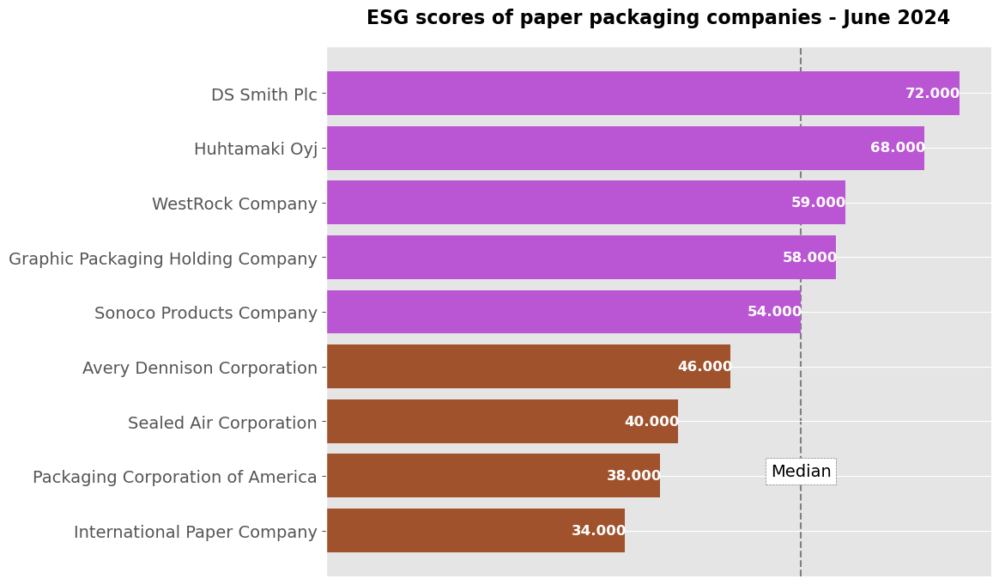

In [57]:
# Now we will add a median line to show why we are coloring companies purple vs. brown (so it's easier to understand at a glance)

medianscore = 54.0
highlight_color = '#BA55D3'
nonhighlight = '#A0522D'  # changed color to "Sienna", a darker brown, so that the numbers are easier to read

dff2['colors'] = dff2['SNP'].apply(lambda x: highlight_color if x >= medianscore else nonhighlight)

fig, ax = plt.subplots(figsize=(10,8))

bars = plt.barh(dff2['Company_name'],dff2['SNP'], color=dff2['colors'])

ax.spines[['right', 'top', 'bottom']].set_visible(False)
ax.xaxis.set_visible(False)
ax.yaxis.set_tick_params(labelsize=14)
ax.bar_label(bars, padding=-45, color='white',
            fontsize=12, label_type='edge', fmt='%.3f', fontweight='bold')

ax.yaxis.set_tick_params(labelsize=14)
# The code below creates the dotted gray line that is our line showing the median value of the company-pulse values
ax.axvline(x=54.0, zorder=0, color='gray', ls='--', lw=1.5)  # creates the dotted gray line; "zorder" affects whether the line is to the front or back, etc. of the bars or other elements, in this case we set it to 0 so it's in the background
ax.text(x=54.0, y=1, s='Median', ha='center', fontsize=14, bbox=dict(facecolor='white', edgecolor='gray', ls='--'))

# Title our plot
ax.set_title("ESG scores of paper packaging companies - June 2024", fontsize=16,
            fontweight='bold', pad=20)

plt.show()

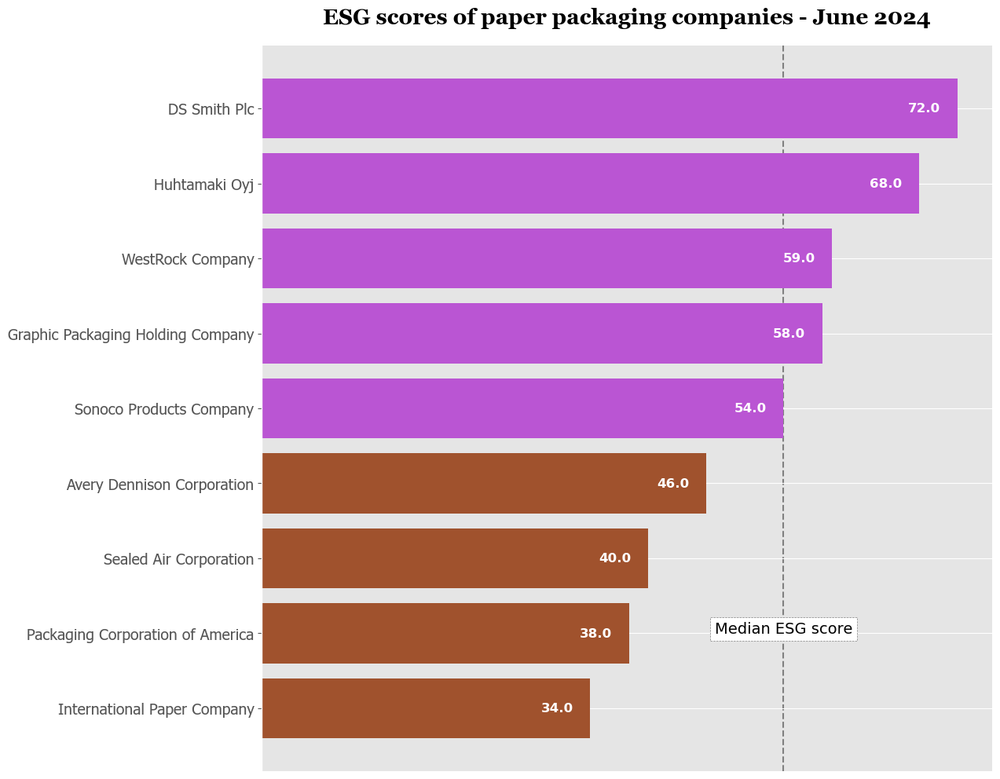

In [58]:
# Now we will change the font of our title and some labels
csfont = {'fontname': 'Georgia'}
hfont = {'fontname': 'Tahoma'}


medianscore = 54.0

# For list of codes for different colors (the below codes are HEX), see https://htmlcolorcodes.com/color-names/
highlight_color = '#BA55D3'
nonhighlight = '#A0522D'

dff2['colors'] = dff2['SNP'].apply(lambda x: highlight_color if x >= medianscore else nonhighlight)

fig, ax = plt.subplots(figsize=(12,12))

bars = plt.barh(dff2['Company_name'],dff2['SNP'], color=dff2['colors'])

ax.spines[['right', 'top', 'bottom']].set_visible(False)
ax.xaxis.set_visible(False)
ax.yaxis.set_tick_params(labelsize=14,labelfontfamily='tahoma')
ax.bar_label(bars, padding=-45, color='white',
            fontsize=12, label_type='edge', fmt='%.1f', fontweight='bold')

ax.axvline(x=54.0, zorder=0, color='gray', ls='--', lw=1.5)
ax.text(x=54.0, y=1, s='Median ESG score', ha='center', fontsize=14, bbox=dict(facecolor='white', edgecolor='gray', ls='--'))
ax.set_title("ESG scores of paper packaging companies - June 2024", fontsize=20,
            fontweight='bold', pad=20,**csfont)

#plt.savefig('paper-packaging.png',bbox_inches='tight', transparent=True, dpi=500)
# Adding "dpi=500" helps increase image quality if you need to use your image file in a Powerpoint, etc.
# You won't be able to tell that the background is transparent in your Jupyter nb, but you can tell when you place it in a slide, report, etc.
plt.show()

In [59]:
# Create a quick pairplot using seaborn
# This will help to find interesting relationships/ how variables may influence each other

sns.pairplot(df1)


In [60]:
df1.columns

Index(['Unique_id', 'Symbol', 'Company_name', 'GIC_sector',
       'GIC_industry_group', 'GIC_Industry', 'GIC_Subindustry', 'Address',
       'ESG_AI_score', 'ESG_beta', 'SNP', 'SNP_environmental',
       'SNP_environ_ind_avg', 'SNP_social', 'SNP_social_ind_avg',
       'SNP_governance', 'SNP_gov_ind_avg', 'Sustainalytics', 'MSCI',
       'SNP_normalized', 'Sustainalytics_normalized', 'MSCI_normalized',
       'Company (long) name', 'Exchange', 'Average volume', 'Market cap',
       'Current price', 'Debt-to-equity', 'Trailing P/E', 'Forward P/E',
       '52-week low', '52-week high', '52-week change', 'Shares outstanding',
       'PEG ratio', 'Price-to-book', 'Return on equity',
       'Trailing Price-to-sales', 'Average volume.1', 'Market cap.1',
       'Full-time Employees', 'isin', 'cusip', 'Securities_type',
       'Currency_code', 'url'],
      dtype='object')

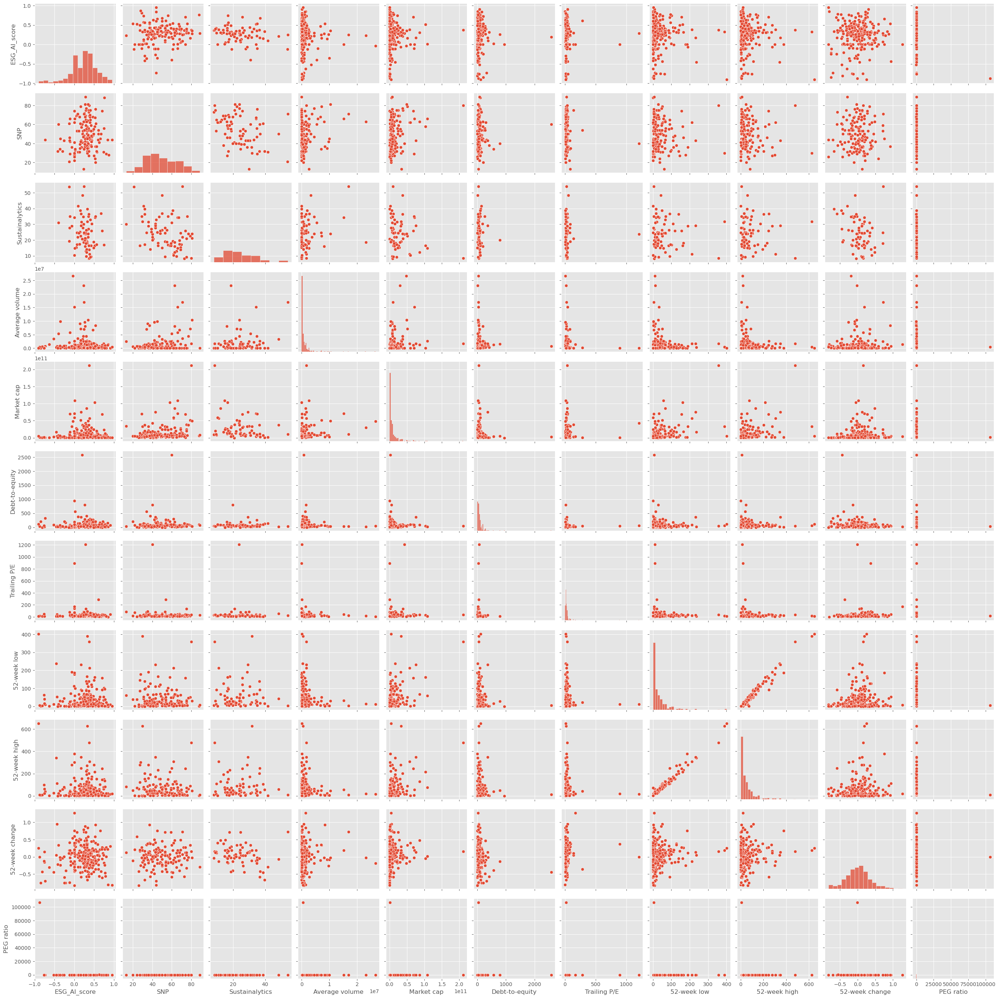

In [61]:
# The plot above is unreadable because it includes all numerical columns.
# We will use "vars=[]"  to choose which columns to include
sns.pairplot(df1, vars=['ESG_AI_score','SNP','Sustainalytics','Average volume','Market cap',
                       'Debt-to-equity', 'Trailing P/E','52-week low', '52-week high', '52-week change', 
                       'PEG ratio'])
plt.show()
# The plots below don't show any strong correlations

In [62]:
df1.columns

Index(['Unique_id', 'Symbol', 'Company_name', 'GIC_sector',
       'GIC_industry_group', 'GIC_Industry', 'GIC_Subindustry', 'Address',
       'ESG_AI_score', 'ESG_beta', 'SNP', 'SNP_environmental',
       'SNP_environ_ind_avg', 'SNP_social', 'SNP_social_ind_avg',
       'SNP_governance', 'SNP_gov_ind_avg', 'Sustainalytics', 'MSCI',
       'SNP_normalized', 'Sustainalytics_normalized', 'MSCI_normalized',
       'Company (long) name', 'Exchange', 'Average volume', 'Market cap',
       'Current price', 'Debt-to-equity', 'Trailing P/E', 'Forward P/E',
       '52-week low', '52-week high', '52-week change', 'Shares outstanding',
       'PEG ratio', 'Price-to-book', 'Return on equity',
       'Trailing Price-to-sales', 'Average volume.1', 'Market cap.1',
       'Full-time Employees', 'isin', 'cusip', 'Securities_type',
       'Currency_code', 'url'],
      dtype='object')

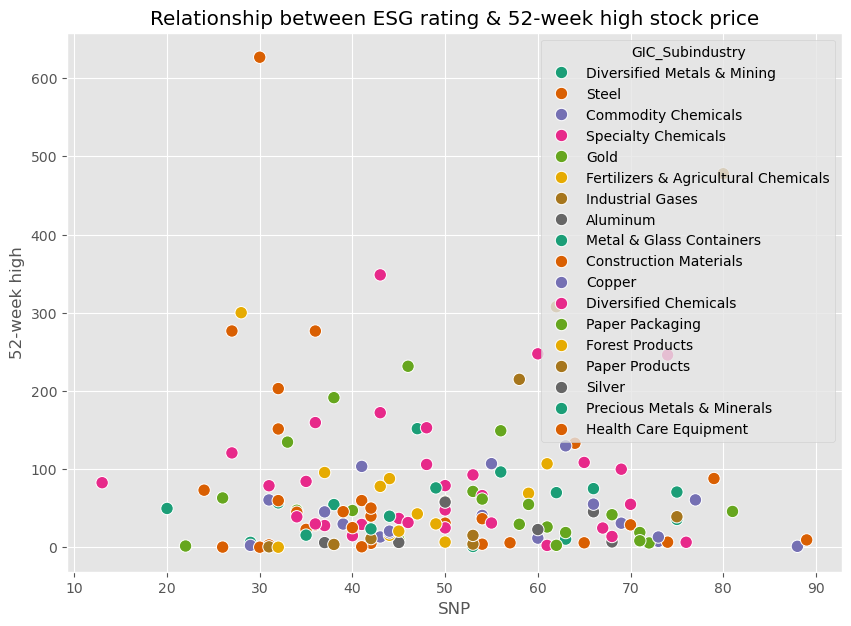

In [75]:
# Create scatterplot using matplotlib and seaborn
# Use a scatterplot to show the relationship between 2 variables (in the example below, the variables are "52-week high" and SNP ESG scores, by subindustry)
sns.scatterplot(x="SNP", y="52-week high", hue="GIC_Subindustry", data=df1, palette="Dark2", s=80)
plt.title("Relationship between ESG rating & 52-week high stock price")
plt.show()

# The chart shows no clear correlation between the variables ("null correlation")

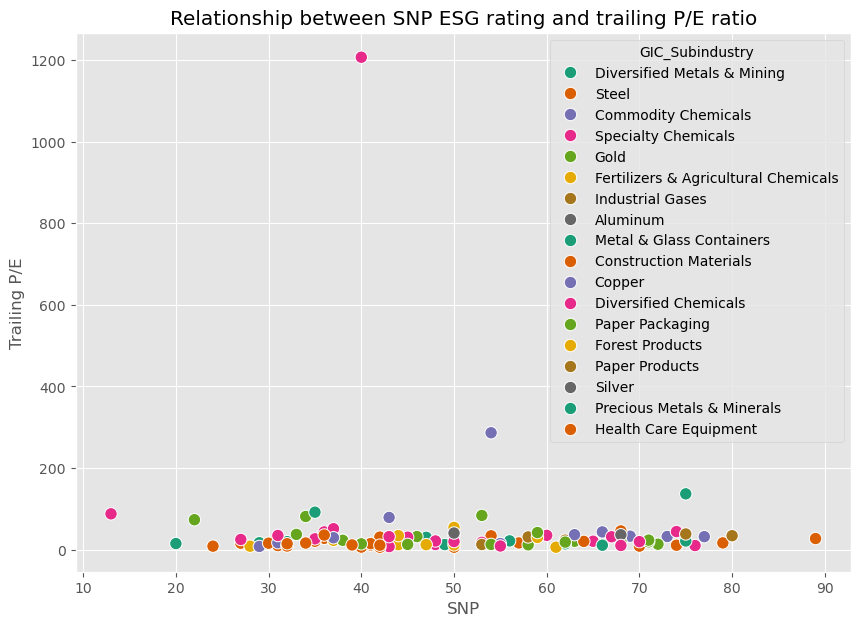

In [64]:
# Create another scatterplot
sns.scatterplot(x="SNP", y="Trailing P/E", hue = 'GIC_Subindustry', data=df1, palette="Dark2", s=80)
plt.title("Relationship between SNP ESG rating and trailing P/E ratio")
plt.show()

In [65]:
df1.head()

,Unique_id,Symbol,Company_name,GIC_sector,GIC_industry_group,GIC_Industry,GIC_Subindustry,Address,ESG_AI_score,ESG_beta,...,Return on equity,Trailing Price-to-sales,Average volume.1,Market cap.1,Full-time Employees,isin,cusip,Securities_type,Currency_code,url
0,195610,AMVMF,AMG Advanced Metallurgical Group N.V,Materials,Materials_1510,Metals & Mining_151040,Diversified Metals & Mining,"WTC Amsterdam, Amsterdam, Netherlands, 1077 XX",0.331230,0.090095,...,0.05155,0.365035,1161.0,5.597559e+08,3600.0,NaN,NaN,Common Stock,USD,http://www.amg-nv.com
1,195583,ANIOY,"Acerinox, S.A",Materials,Materials_1510,Metals & Mining_151040,Steel,"Calle Santiago de Compostela, 100, Madrid, Spa...",0.180600,NaN,...,0.05192,0.434976,493.0,2.746791e+09,8245.0,NaN,00444E103,Common Stock,USD,http://www.acerinox.com
2,206683,ASIX,AdvanSix Inc,Materials,Materials_1510,Chemicals_151010,Commodity Chemicals,"300 Kimball Drive, Parsippany, NJ, United Stat...",0.608925,NaN,...,0.00309,0.418189,136896.0,6.146892e+08,1450.0,US00773T1016,00773T101,Common Stock,USD,http://www.advansix.com
3,244892,ADES,Advanced Emissions Solutions Inc,Materials,Materials_1510,Chemicals_151010,Specialty Chemicals,"8051 E. Maplewood Avenue, Greenwood Village, C...",0.631753,NaN,...,NaN,NaN,NaN,NaN,NaN,US00770C1018,00770C101,Common Stock,USD,https://www.advancedemissionssolutions.com
4,191126,AEM,Agnico Eagle Mines Limited,Materials,Materials_1510,Metals & Mining_151040,Gold,"145 King Street East, Toronto, ON, Canada, M5C...",0.324521,0.146576,...,0.02392,4.745945,2808933.0,3.297041e+10,NaN,US0084741083,008474108,Common Stock,USD,http://www.agnicoeagle.com


In [66]:
df1.dtypes

Unique_id                     object
Symbol                        object
Company_name                  object
GIC_sector                    object
GIC_industry_group            object
GIC_Industry                  object
GIC_Subindustry               object
Address                       object
ESG_AI_score                 float64
ESG_beta                     float64
SNP                          float64
SNP_environmental            float64
SNP_environ_ind_avg          float64
SNP_social                   float64
SNP_social_ind_avg           float64
SNP_governance               float64
SNP_gov_ind_avg              float64
Sustainalytics               float64
MSCI                          object
SNP_normalized               float64
Sustainalytics_normalized    float64
MSCI_normalized              float64
Company (long) name           object
Exchange                      object
Average volume               float64
Market cap                   float64
Current price                float64
D

In [67]:
# Heatmap
# Heatmap is a data visualization with colors representing numerical values
# Heatmaps are best used for visualizing large amounts of multi-dimensional data; depending on color/ hue, the eye can quickly see relationships
# Heatmaps are based on numerical values so need to keep only the numerical columns that we want to examine for correlations
df_numericals = df1[['SNP', 'Sustainalytics', 'Market cap', '52-week low', '52-week high', 'Current price',
                     'Debt-to-equity', 'Trailing P/E', 'Forward P/E', '52-week change', 'Price-to-book',
                    'Return on equity']]
df_numericals

,SNP,Sustainalytics,Market cap,52-week low,52-week high,Current price,Debt-to-equity,Trailing P/E,Forward P/E,52-week change,Price-to-book,Return on equity
0,32.0,39.7,5.597559e+08,16.510,56.870,17.3800,121.875,19.528090,NaN,-0.670417,1.036807,0.05155
1,57.0,NaN,2.746791e+09,4.530,5.800,5.4200,83.926,16.424242,NaN,-0.007782,0.527802,0.05192
2,54.0,NaN,6.146892e+08,21.552,40.855,22.9200,46.551,286.500000,5.984335,-0.362802,0.861784,0.00309
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,53.0,19.0,3.297041e+10,43.220,71.500,66.1800,10.140,83.772150,19.350878,0.294537,1.678545,0.02392
...,...,...,...,...,...,...,...,...,...,...,...,...
277,45.0,NaN,7.376850e+09,13.840,20.690,14.4800,57.701,NaN,NaN,-0.189597,0.497834,-0.00433
278,NaN,NaN,1.121845e+08,0.180,0.270,0.1877,36.899,9.385000,NaN,-0.296296,0.027175,0.01447
279,NaN,NaN,1.758240e+07,0.410,1.350,0.5241,24.762,NaN,NaN,-0.246556,0.184089,-0.06910
280,22.0,NaN,4.921978e+09,1.260,1.700,1.4660,73.424,73.300000,NaN,0.205674,0.248685,NaN


In [68]:
# Drop rows that have any Nan values
df_numericals2 = df_numericals.dropna()

In [69]:
df_numericals2.reset_index(drop=True)

,SNP,Sustainalytics,Market cap,52-week low,52-week high,Current price,Debt-to-equity,Trailing P/E,Forward P/E,52-week change,Price-to-book,Return on equity
0,53.0,19.0,3.297041e+10,43.22,71.50,66.1800,10.140,83.772150,19.350878,0.294537,1.678545,0.02392
1,62.0,11.2,5.728476e+10,212.24,307.71,257.6843,87.781,23.277716,19.201511,-0.131350,3.841161,0.16116
2,60.0,36.7,1.136010e+10,92.29,247.44,96.6595,31.084,35.021557,12.440090,-0.583355,1.221852,0.03862
3,63.0,16.1,1.416433e+10,8.45,10.51,9.8000,193.563,21.777779,13.243243,-0.029762,3.588429,0.15945
4,69.0,15.4,2.760400e+10,15.50,30.88,28.0000,33.857,32.941177,25.225225,0.488499,3.083700,0.10969
5,46.0,18.1,1.763072e+10,165.21,231.53,218.8700,147.024,31.998537,20.765654,0.260376,8.003730,0.26099
6,45.0,25.0,7.531751e+09,25.03,36.98,34.1350,193.070,30.477676,15.103982,0.041451,4.350070,0.14541
7,40.0,23.7,4.314868e+10,10.66,14.89,12.0700,59.015,1207.000000,4.105442,-0.009024,0.289845,0.00461
8,63.0,18.7,2.954742e+10,13.76,18.95,16.8300,14.666,20.524391,11.527397,-0.023991,1.259353,0.06834
9,44.0,33.0,1.358984e+10,67.97,87.90,74.3500,40.233,12.289255,13.469203,0.052392,2.519485,0.17730


In [70]:
df_numericals2.dtypes

SNP                 float64
Sustainalytics      float64
Market cap          float64
52-week low         float64
52-week high        float64
Current price       float64
Debt-to-equity      float64
Trailing P/E        float64
Forward P/E         float64
52-week change      float64
Price-to-book       float64
Return on equity    float64
dtype: object

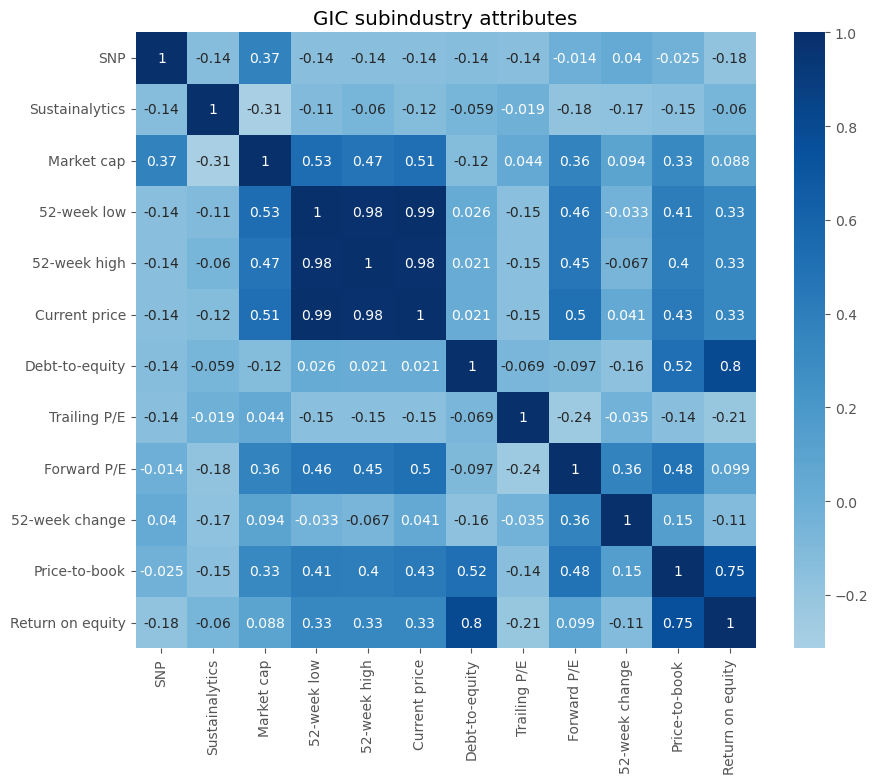

<Figure size 1000x700 with 0 Axes>

In [76]:
# see https://medium.com/@rokaandy/python-data-visualization-heatmaps-79fa7506c410
fig, ax = plt.subplots(figsize=(10,8))
sns.heatmap(df_numericals2.corr(), center=0, cmap='Blues', annot=True)

ax.set_title("GIC subindustry attributes")

# alternatively, use cmap = "Spectral_r"
plt.show()

# Darker colors = stronger correlations

# save plot as png
plt.savefig('heatmap1.png', bbox_inches='tight')

# This can be used to make sure you don't have a lot of "open figures" when/ if doing loops; see https://stackoverflow.com/questions/9622163/save-plot-to-image-file-instead-of-displaying-it
#plt.close(fig)

In [ ]:
# These charts can help you see patterns much more quickly and easily than you can by simply looking at dataframes and spreadsheets.